<a href="https://colab.research.google.com/github/ClaraJ-se/SegMine/blob/main/notebooks/run_cellpose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Running cellpose in colab with a GPU

(thanks to Matteo Carandini for setting this up)

UPDATED DEC 2020 for TORCH VERSION cellpose v0.6

UPDATED NOV 2021 for cellpose / omnipose v0.7

## installation

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

Note that cellpose uses the latest version of numpy, so please click the "Restart runtime" button once the install completes.

In [1]:
!pip install "opencv-python-headless<4.3" --quiet
!pip install cellpose --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 MB 17.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.3.1 requires opencv-python-headless>=4.1.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
qudida 0.0.4 requires opencv-python-headless>=4.0.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 82.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.6/39.6 MB 15.2 MB/s eta 0:00:00


Check CUDA version and GPU

In [2]:
!nvcc --version --quiet
!nvidia-smi --quiet

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
ERROR: Option --quiet is not recognized. Please run 'nvidia-smi -h'.



import libraries and check GPU (the first time you import cellpose the models will download).

In [5]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models, core

use_GPU = core.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

# call logger_setup to have output of cellpose written
from cellpose.io import logger_setup
logger_setup();


>>> GPU activated? 1


Download sample images

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Number of filenames read: 616.


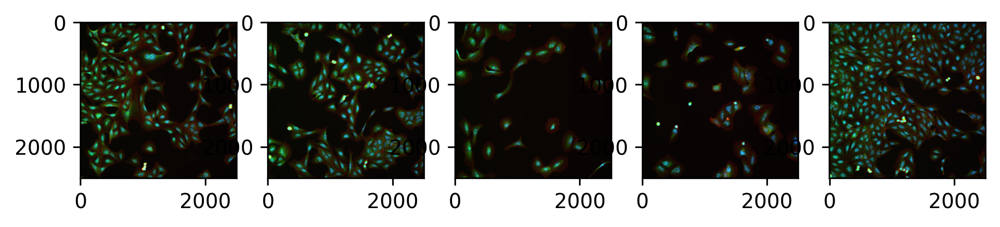

In [6]:
import os, shutil
from cellpose import utils

# # REPLACE FILES WITH YOUR IMAGE PATHS
Input_Directory = "/content/drive/MyDrive/SegMine/data/images_rgb"
input_dir = os.path.join(Input_Directory, "")
image_format = "tiff"
save_dir = input_dir+"Masks/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

files=[]
for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break #only read the root directory; can change this to include levels

nimg = len(files)
if(nimg==0):
  print("Number of filenames read: %d." %(nimg))
  print("Cannot read filenames. Check if folder has images")
else:
  print("Number of filenames read: %d." %(nimg))


# Get index of subset of image representative of the dataset diversity
substrings = ["B02_s1", "D14_s1", "E03_s1", "I04_s1", "L10_s1"]
subset_imgs = [skimage.io.imread(f) for f in files if any(s in f for s in substrings)]
# plot subset
plt.figure(figsize=(8,4))
for k,img in enumerate(subset_imgs):
  plt.subplot(1,5,k+1)
  plt.imshow(img)


## run cellpose on a subset of :2D sample images

(note that we have limited GPU access)

In [8]:
# RUN CELLPOSE

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto3' or model_type='nuclei'
model_choice = 'cyto3'
model = models.Cellpose(gpu=use_GPU, model_type=model_choice)

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus
channels = [2,1]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images
diameter = 0 # the diameter of U2OS cells ranges between 16 ± 2 μm in width, 23 ± 3 μm in length but there is quite a diveristy of size in the dataset which we want to capture so let the algorithm estimate
cellprob_threshold = -1
flow_threshold = 0.4
masks, flows, styles, diams = model.eval(subset_imgs, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)

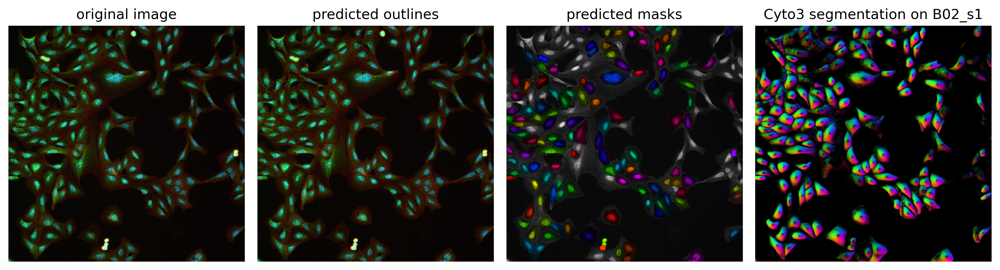

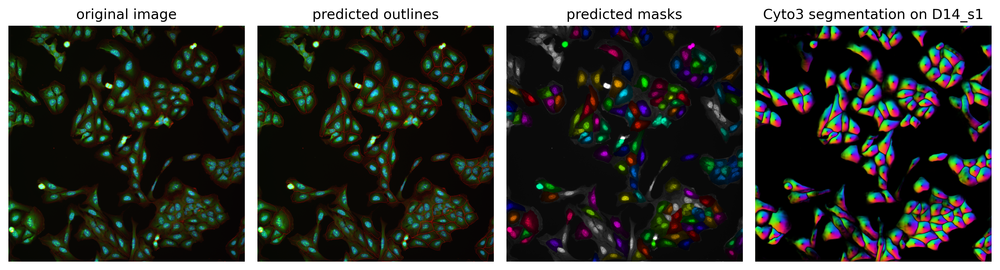

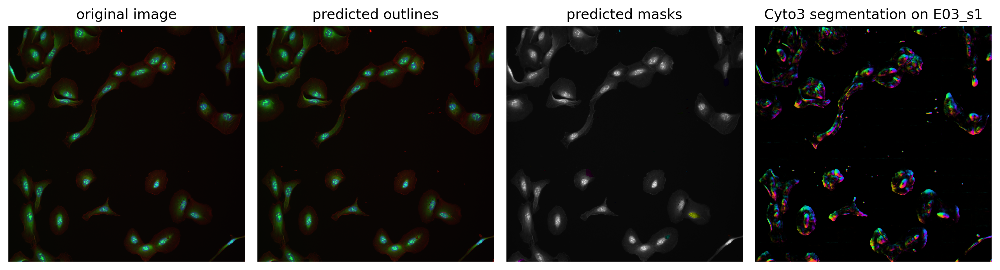

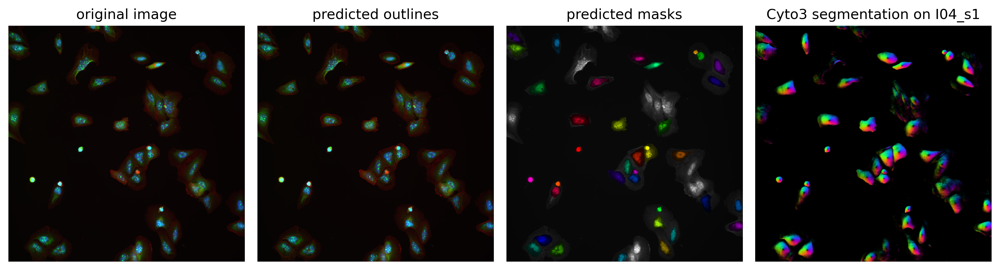

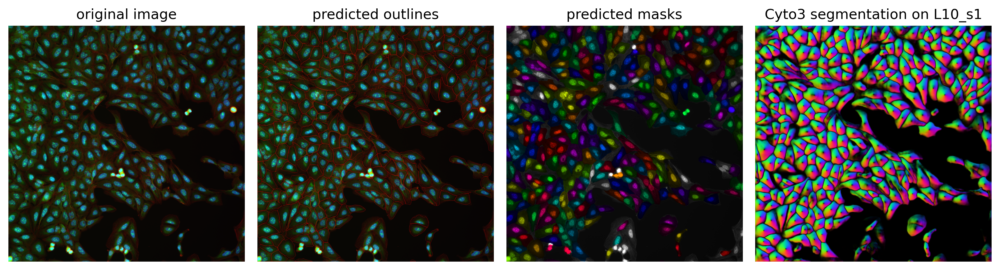

In [11]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(subset_imgs)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, subset_imgs[idx], maski, flowi)
    plt.savefig(save_dir+str(idx)+"segmt.png")
    plt.title(f"Cyto3 segmentation on {substrings[idx]}")
    plt.tight_layout()
    plt.show()


## run and save masks for the entire image set


you will see the files save in the Files tab and you can download them from there

In [2]:
# load all images
imgs = [ for f in files]
nimg = len(imgs)
if(nimg==0):
  print("Number of images loaded: %d." %(nimg))
  print("Cannot read images. Check if folder has images")
else:
  print("Number of images loaded: %d." %(nimg))

SyntaxError: invalid syntax (<ipython-input-2-6e5a4371f31e>, line 2)

In [13]:
# Run and save masks and parameters
for f_idx, f in enumerate(files):
    file_name = os.path.splitext(os.path.basename(f))[0]
    subfilename = '_'.join(file_name.split('_')[:4])
    img = skimage.io.imread(f)
    print("\nSegmenting: ",file_name)
    mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    #save images in folder with the diameter value used in cellpose
    print("Segmentation complete . Saving Masks and flows")
    #Output name for masks
    mask_output_name=save_dir+"MASK_"+subfilename+".tiff"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
    if f_idx > 5:
      break
#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt"
outFile=open(parameters_file, "w")
outFile.write("CELLPOSE PARAMETERS\n")
outFile.write("Model: "+model_choice+"\n")
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
outFile.write("Diameter: "+str(diameter)+"\n")
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n")
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n")
outFile.close()
print("\nSegmentation complete and files saved")


Segmenting:  B02_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B02_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B03_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B03_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B04_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B04_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  B05_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmentation complete and files saved


In [37]:
model_choice = 'cyto3'
channels = [2,1]
diameter = 0
model = models.Cellpose(gpu=use_GPU, model_type=model_choice)
for img_idx, img in enumerate(imgs):
    file_name=os.path.splitext(os.path.basename(files[img_idx]))[0]
    print("\nSegmenting: ",img_idx, file_name)
    mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    #save images in folder with the diameter value used in cellpose
    print("Segmentation complete . Saving Masks and flows")
    #Output name for masks
    mask_output_name=save_dir+"MASK_"+file_name+".tiff"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt"
outFile=open(parameters_file, "w")
outFile.write("CELLPOSE PARAMETERS\n")
outFile.write("Model: "+model_choice+"\n")
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
outFile.write("Diameter: "+str(diameter)+"\n")
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n")
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n")
outFile.close()
print("\nSegmentation complete and files saved")


Segmenting:  0 L07_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  1 L07_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  2 L08_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  3 L08_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  4 L09_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  5 L09_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  6 L10_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  7 L10_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  8 L11_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  9 L11_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  10 L12_s1_x0_y0_Fluorescence_rgb
Segmentation complete .